In [1]:
# from nets.nets import FreqLayer

# from env.finger import Finger

from nets.nets import (
    StateEncoder,
    StateDecoder,
)

import optax

import jax
from jax import numpy as jnp
from jax.tree_util import Partial, tree_flatten
from jax.experimental.host_callback import id_tap

from einops import rearrange

import matplotlib.pyplot as plt

from tqdm import tqdm

# Let's just to a sanity check and see if we can train anything at all

In [2]:
key = jax.random.PRNGKey(0)

In [3]:
encoder = StateEncoder(6)
decoder = StateDecoder(6)

In [4]:
def encode_and_decode(x, encoder_params, decoder_params):
    encoded = encoder.apply(encoder_params, x)
    decoded = decoder.apply(decoder_params, encoded)
    return decoded

In [16]:
def train_step(carry_pack, x_pack, optimizer):
    i, data_chunk = x_pack
    encoder_params, decoder_params, opt_state = carry_pack

    # rng, key = jax.random.split(key)
    # data_chunk = jax.random.uniform(rng, [batch_size, 6], minval=-3, maxval=3)

    def loss_fn(grad_pack):
        encoder_params, decoder_params = grad_pack
        y_gauss = jax.vmap(
            Partial(
                encode_and_decode,
                encoder_params=encoder_params,
                decoder_params=decoder_params,
            ),
        )(
            x=data_chunk,
        )

        err = jnp.mean(jnp.square(y_gauss[..., :6] - data_chunk))
        log_err = jnp.log(err)
        squared_err = jnp.square(err)
        return jnp.mean(log_err + squared_err)

        # # MSE loss
        # return jnp.mean(jnp.square(y_gauss[..., :6] - data_chunk))

    loss, (encoder_grad, decoder_grad) = jax.value_and_grad(loss_fn)(
        [encoder_params, decoder_params],
    )
    
    net_update, opt_state = optimizer.update(
        [encoder_grad, decoder_grad],
        opt_state,
        [encoder_params, decoder_params],
    )
    encoder_params, decoder_params = optax.apply_updates(
        [encoder_params, decoder_params],
        net_update,
    )

    jax.debug.print("Step {} Loss: {}", i, loss)

    return (encoder_params, decoder_params, opt_state), loss

In [20]:
@Partial(jax.jit, static_argnums=[2, 3, 4, 5, 6])
def train_rollout(
    carry_pack,
    x_pack,
    optimizer,
    rollout_size=1024,
    epochs=64,
    data_len=64,
    batch_size=64,
):
    encoder_params, decoder_params, opt_state = carry_pack
    i, rng = x_pack
    rng, key = jax.random.split(rng)
    data = jax.random.uniform(
        rng,
        [rollout_size * data_len, 6],
        minval=-3,
        maxval=3,
    )

    start_step = i * rollout_size // batch_size * epochs

    def epoch_loop_bdy(carry_pack, x_pack, start_step, data):
        i, key = x_pack
        encoder_params, decoder_params, opt_state = carry_pack

        start_step = start_step + i * rollout_size // batch_size

        rng, key = jax.random.split(key)
        data = jax.random.shuffle(rng, data)
        data = rearrange(data, "(b s) d -> b s d", s=batch_size * data_len)

        (encoder_params, decoder_params, opt_state), losses = jax.lax.scan(
            Partial(train_step, optimizer=optimizer),
            (encoder_params, decoder_params, opt_state),
            (
                jnp.arange(rollout_size // batch_size) + start_step,
                data,
            ),
        )

        return (encoder_params, decoder_params, opt_state), losses

    rng, key = jax.random.split(key)
    rngs = jax.random.split(rng, epochs)
    (encoder_params, decoder_params, opt_state), losses = jax.lax.scan(
        Partial(epoch_loop_bdy, start_step=start_step, data=data),
        (encoder_params, decoder_params, opt_state),
        (
            jnp.arange(epochs),
            rngs,
        ),
    )

    losses = rearrange(losses, "e l -> (e l)")

    return (encoder_params, decoder_params, opt_state), losses

In [21]:
def train(
    key,
    learning_rate,
    end_lr,
    rollouts,
    epochs,
    rollout_size,
    batch_size,
    ep_len,
):
    final_div = (learning_rate / 25.0) / end_lr
    optimizer = optax.adamw(
        learning_rate=optax.cosine_onecycle_schedule(
            transition_steps=8192,
            peak_value=learning_rate,
            pct_start=0.3,
            div_factor=10,
            final_div_factor=final_div,
        )
    )

    rng, key = jax.random.split(key)
    encoder_params = encoder.init(rng, jnp.ones(6))
    decoder_params = decoder.init(rng, jnp.ones(6))
    opt_state = optimizer.init([encoder_params, decoder_params])

    idxs = jnp.arange(rollouts)

    rng, key = jax.random.split(key)
    rngs = jax.random.split(rng, rollouts)
    (encoder_params, decoder_params, opt_state), losses = jax.lax.scan(
        Partial(
            train_rollout,
            optimizer=optimizer,
            epochs=epochs,
            rollout_size=rollout_size,
            data_len=ep_len,
            batch_size=batch_size,
        ),
        (encoder_params, decoder_params, opt_state),
        (idxs, rngs),
    )
    losses = rearrange(losses, "r l -> (r l)")

    return losses, encoder_params, decoder_params

# Sweep for LR

In [42]:
steps = 16384

end_lr = 1.0e-5

learning_rates = [
    5e-2,
    2.5e-2,
    1e-2,
    5e-3,
    2.5e-3,
    1e-3,
    5e-4,
    2.5e-4,
    1e-4,
]

losseses = []

for learning_rate in learning_rates:
    rng, key = jax.random.split(key)
    losses, encoder_params, decoder_params = train(
        key=rng,
        learning_rate=learning_rate,
        end_lr=end_lr,
        rollouts=16,
        batch_size=64,
        epochs=64,
        ep_len=64,
        rollout_size=1024,
    )
    losseses.append(losses)

/home/mishmish/Documents/latch/latch/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)


Step 0 Loss: 10.373129844665527
Step 1 Loss: 78.56787109375
Step 2 Loss: 10.20668888092041
Step 3 Loss: 10.448680877685547
Step 4 Loss: 10.207984924316406
Step 5 Loss: 10.303133010864258
Step 6 Loss: 10.270483016967773
Step 7 Loss: 10.542935371398926
Step 8 Loss: 10.279488563537598
Step 9 Loss: 10.056285858154297
Step 10 Loss: 10.432506561279297
Step 11 Loss: 10.618268966674805
Step 12 Loss: 10.620282173156738
Step 13 Loss: 10.530965805053711
Step 14 Loss: 10.502975463867188
Step 15 Loss: 10.33717155456543
Step 16 Loss: 10.179191589355469
Step 17 Loss: 10.258337020874023
Step 18 Loss: 9.691340446472168
Step 19 Loss: 9.779888153076172
Step 20 Loss: 9.446578025817871
Step 21 Loss: 9.087128639221191
Step 22 Loss: 8.895292282104492
Step 23 Loss: 8.856451034545898
Step 24 Loss: 9.028036117553711
Step 25 Loss: 9.236968994140625
Step 26 Loss: 8.921764373779297
Step 27 Loss: 9.073609352111816
Step 28 Loss: 9.116165161132812
Step 29 Loss: 9.001707077026367
Step 30 Loss: 9.213622093200684
Step 3

In [44]:
losseses = [rearrange(losses, "r l -> (r l)") for losses in losseses]

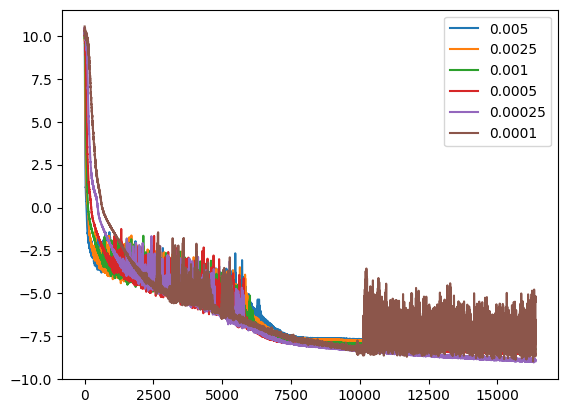

In [45]:
# plt.yscale("log")
for losses, learning_rate in zip(losseses[3:], learning_rates[3:]):
    plt.plot(losses, label=learning_rate)
plt.legend()

In [34]:
stacked_losses = jnp.stack(losseses)
min_losses = jnp.min(stacked_losses, axis=-1)
min_losses_idx = jnp.argmin(min_losses, axis=-1)
min_loss_min_idx = jnp.argmin(stacked_losses[min_losses_idx])
print(
    f"Min loss: {min_losses[min_loss_min_idx]} with lr {learning_rates[int(min_losses_idx)]} at step {min_loss_min_idx}"
)

Min loss: -7.993198394775391 with lr 0.00025 at step 15092


# Now sweep for end_lr

# With LR 5e-5 and end_lr 2.5e-6 we get findal loss 0.000225, decent I guess.

# Using a bigger freq_layer we get 0.00027, so it's not better

# Using a deeper model we get 0.00016, so it's definitely better. Optimization params: LR=5e-5, end_lr=1e-6

# Using adamw we get 0.00008 with LR=1e-3, end_lr=2.5e-5

In [37]:
steps = 32768

end_lrs = [
    5e-3,
    2.5e-3,
    1e-3,
    5e-4,
    2.5e-4,
    1e-4,
    5e-5,
    2.5e-5,
    1e-5,
    5e-6,
    2.5e-6,
    1e-6,
    5e-7,
    2.5e-7,
    1e-7,
]

learning_rate = 2.5e-4

losseses = []

for end_lr in end_lrs:
    rng, key = jax.random.split(key)
    losses, encoder_params, decoder_params = train(
        key=rng,
        learning_rate=learning_rate,
        end_lr=end_lr,
        rollouts=16,
        batch_size=64,
        epochs=64,
        ep_len=64,
        rollout_size=1024,
    )
    losseses.append(losses)

/home/mishmish/Documents/latch/latch/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)


Step 0 Loss: 10.217931747436523
Step 1 Loss: 10.18368148803711
Step 2 Loss: 9.968049049377441
Step 3 Loss: 10.100401878356934
Step 4 Loss: 10.053655624389648
Step 5 Loss: 10.111848831176758
Step 6 Loss: 9.97171688079834
Step 7 Loss: 9.90891170501709
Step 8 Loss: 10.09473991394043
Step 9 Loss: 10.134023666381836
Step 10 Loss: 9.927452087402344
Step 11 Loss: 10.019951820373535
Step 12 Loss: 9.9185152053833
Step 13 Loss: 9.935935020446777
Step 14 Loss: 10.043943405151367
Step 15 Loss: 10.045575141906738
Step 16 Loss: 9.933591842651367
Step 17 Loss: 9.920708656311035
Step 18 Loss: 10.029327392578125
Step 19 Loss: 9.632415771484375
Step 20 Loss: 9.883469581604004
Step 21 Loss: 9.876952171325684
Step 22 Loss: 10.271759033203125
Step 23 Loss: 9.863025665283203
Step 24 Loss: 9.730372428894043
Step 25 Loss: 9.766093254089355
Step 26 Loss: 9.829610824584961
Step 27 Loss: 9.851849555969238
Step 28 Loss: 10.044098854064941
Step 29 Loss: 9.723011016845703
Step 30 Loss: 9.947196960449219
Step 31 Los

In [40]:
losseses = [rearrange(losses, "r l -> (r l)") for losses in losseses]

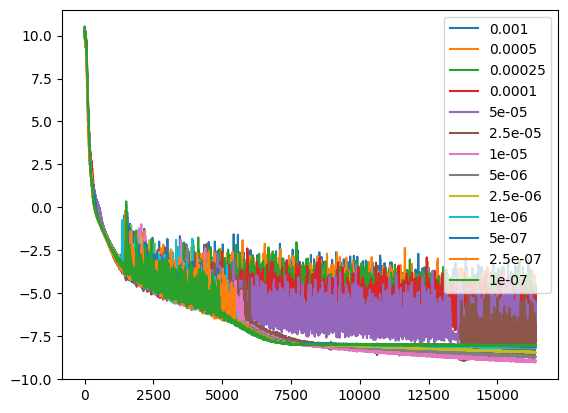

In [41]:
for losses, end_lr in zip(losseses[2:], end_lrs[2:]):
    plt.plot(losses, label=end_lr)
plt.legend()

In [ ]:
loss_stack = jnp.stack(losseses)
min_run_idx = jnp.argmin(jnp.min(loss_stack, axis=-1))
min_run_min_step_idx = jnp.argmin(loss_stack[min_run_idx])

print(
    f"Min loss: {loss_stack[min_run_idx, min_run_min_step_idx]} with end lr {end_lrs[min_run_idx]} at step {min_run_min_step_idx}"
)

Min loss: -9.995769500732422 with end lr 5e-05 at step 32615
